# Semantic segmentation: Comparison of the generated masks

# Packages, data & functions
## Import Packages

In [1]:
import os
cwd = os.getcwd()
import numpy as np 
import pandas as pd 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import tensorflow as tf
from tensorflow.keras import applications
from tensorflow.keras.models import Model
from tensorflow.keras.utils import image_dataset_from_directory
import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential, load_model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout
from keras.layers import Input, Activation, BatchNormalization, Dropout, Lambda, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
from keras.preprocessing import image
# Define function to plot some images
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import cv2
from PIL import Image

#Mixed precision is useful if compute capability > 7
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

from numpy.random import seed
seed(42)
tf.keras.utils.set_random_seed(42)

2023-06-22 09:48:39.319615: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-22 09:48:39.865714: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-06-22 09:48:40.922300: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-06-22 09:48:40.922468: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or 

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3050 Laptop GPU, compute capability 8.6


2023-06-22 09:48:43.190509: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-22 09:48:43.300925: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-22 09:48:43.301026: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-06-22 09:48:43.301380: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:966] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


## Useful functions

In [2]:
from tensorflow.keras import backend as K

# function to create dice coefficient
def dice_coef(y_true, y_pred, smooth=100):
    
    y_true_flatten = K.flatten(y_true)
    y_pred_flatten = K.flatten(y_pred)

    intersection = K.sum(y_true_flatten * y_pred_flatten)
    union = K.sum(y_true_flatten) + K.sum(y_pred_flatten)
    return (2 * intersection + smooth) / (union + smooth)

# function to create dice loss
def dice_loss(y_true, y_pred, smooth=100):
    return -dice_coef(y_true, y_pred, smooth)

# function to create iou coefficient
def iou_coef(y_true, y_pred, smooth=100):
    intersection = K.sum(y_true * y_pred)
    sum = K.sum(y_true + y_pred)
    iou = (intersection + smooth) / (sum - intersection + smooth)
    return iou

## Loading the data

In [5]:
unet_image_height = 256
unet_image_width = 256

crack_test_dir = "/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/"

crack_test_base_dataset = image_dataset_from_directory(
    crack_test_dir,
    labels=None,
    image_size = (unet_image_height, unet_image_width),
    crop_to_aspect_ratio = True,
    shuffle = False,
    batch_size = 1)

Found 120000 files belonging to 1 classes.


In [16]:
crack_test_base_df = pd.DataFrame(crack_test_base_dataset.file_paths.copy())
crack_test_base_df.columns = ['image']
crack_test_base_df[['mask']] = crack_test_base_df[['image']]
crack_test_base_df['mask'] = crack_test_base_df.apply(lambda x: str(x.image).replace('image', 'mask'), axis=1)
crack_test_base_df['mask_2'] = crack_test_base_df.apply(lambda x: str(x.image).replace('image', 'mask_2'), axis=1)

In [17]:
pd.set_option('display.max_colwidth', None)

In [18]:
display(crack_test_base_df)

,image,mask,mask_2
0,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00001.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00001.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00001.jpg
1,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00002.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00002.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00002.jpg
2,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00003.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00003.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00003.jpg
3,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00004.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00004.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00004.jpg
4,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00005.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00005.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00005.jpg
...,...,...,...
119995,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg
119996,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg
119997,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg
119998,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg


In [19]:
crack_test_base_df = crack_test_base_df[~crack_test_base_df['image'].str.contains("mask")]

In [20]:
display(crack_test_base_df)

,image,mask,mask_2
0,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00001.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00001.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00001.jpg
1,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00002.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00002.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00002.jpg
2,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00003.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00003.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00003.jpg
3,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00004.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00004.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00004.jpg
4,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/n_00005.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/n_00005.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/n_00005.jpg
...,...,...,...
39995,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19996.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/p_19996.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19996.jpg
39996,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19997.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/p_19997.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19997.jpg
39997,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19998.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/p_19998.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19998.jpg
39998,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/image/p_19999.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask/p_19999.jpg,/home/philippe/development/python/concrete_cracks_semantic_segmentation/data_unet/mask_2/p_19999.jpg


## Loading the model

In [27]:
unet_model_2 = keras.models.load_model('./unet_model_2_2', custom_objects = {"dice_loss": dice_loss, "iou_coef": iou_coef, "dice_coef": dice_coef})

# Mask Comparison

1/1 [==============================] - 0s 263ms/step


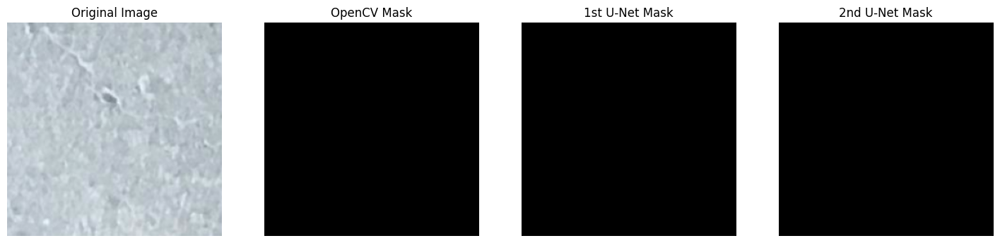

1/1 [==============================] - 0s 43ms/step


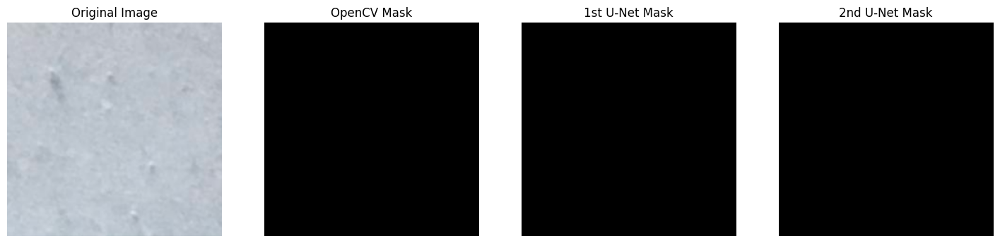

1/1 [==============================] - 0s 41ms/step


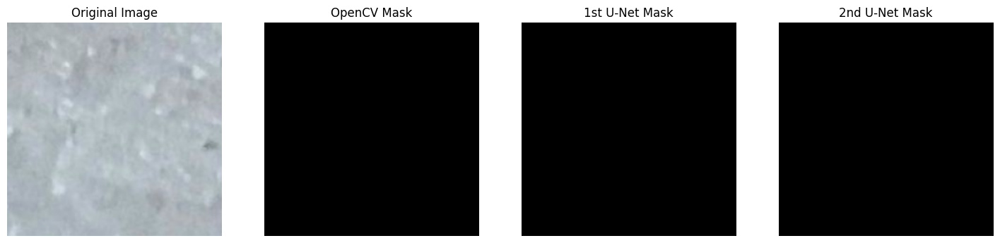

1/1 [==============================] - 0s 28ms/step


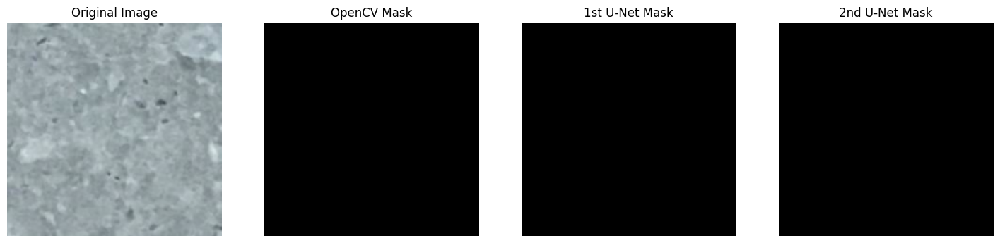

1/1 [==============================] - 0s 47ms/step


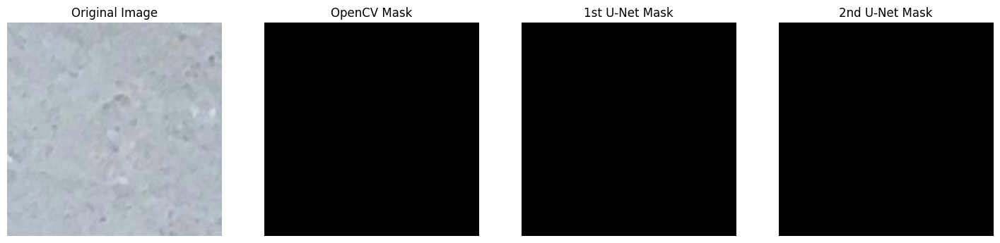

1/1 [==============================] - 0s 33ms/step


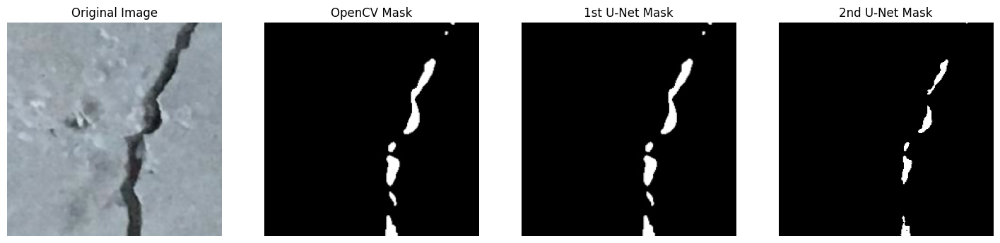

1/1 [==============================] - 0s 31ms/step


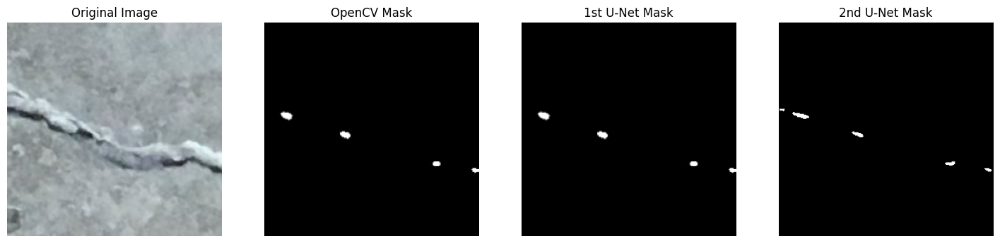

1/1 [==============================] - 0s 37ms/step


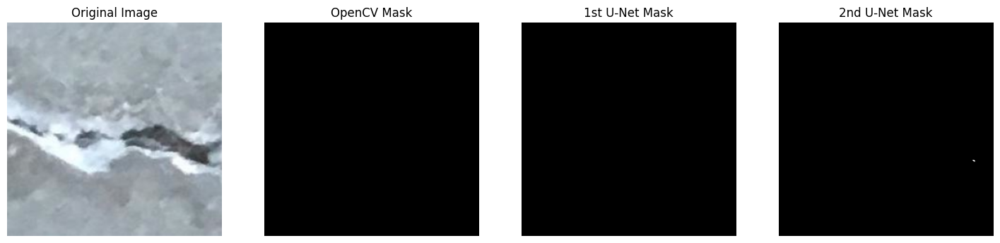

1/1 [==============================] - 0s 31ms/step


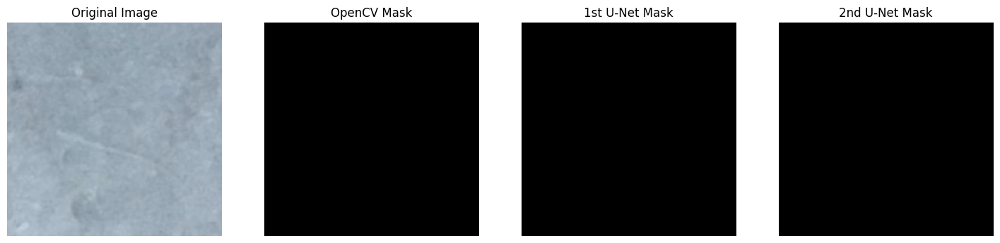

1/1 [==============================] - 0s 30ms/step


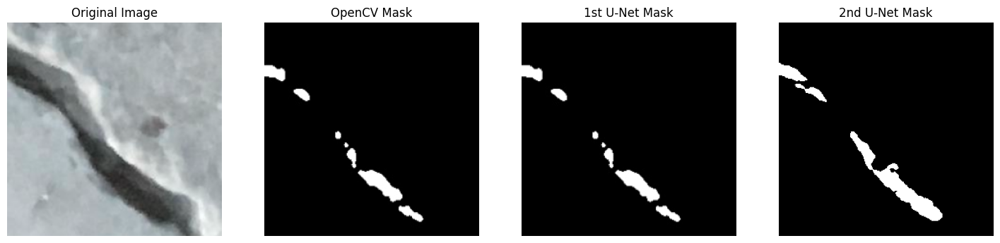

1/1 [==============================] - 0s 30ms/step


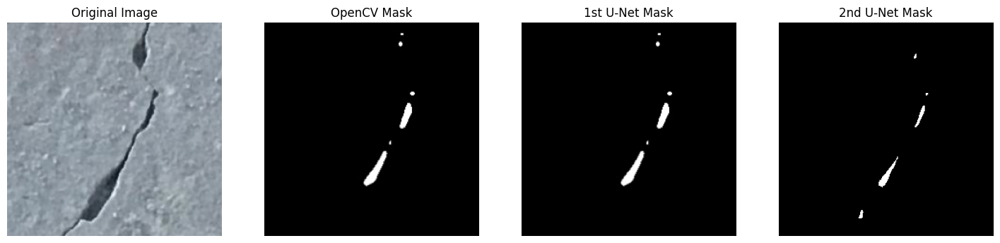

1/1 [==============================] - 0s 28ms/step


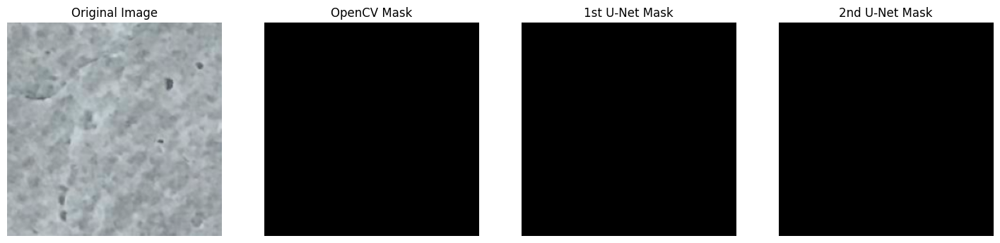

1/1 [==============================] - 0s 29ms/step


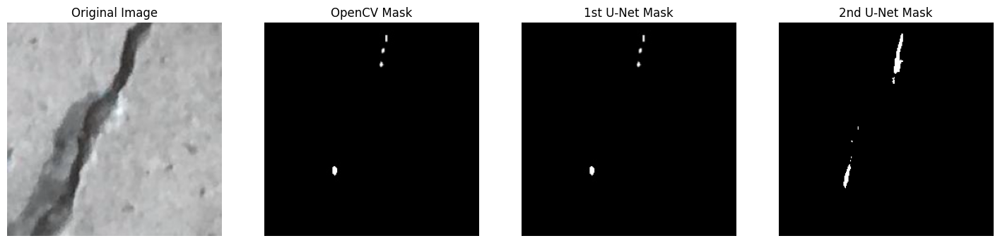

1/1 [==============================] - 0s 31ms/step


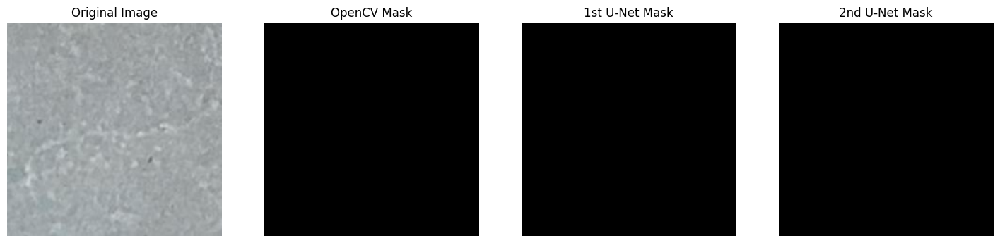

1/1 [==============================] - 0s 51ms/step


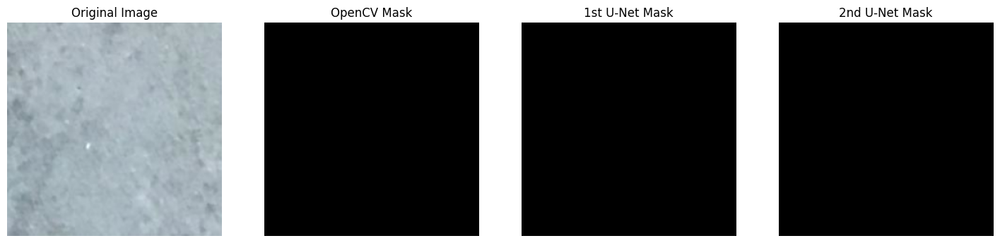

1/1 [==============================] - 0s 28ms/step


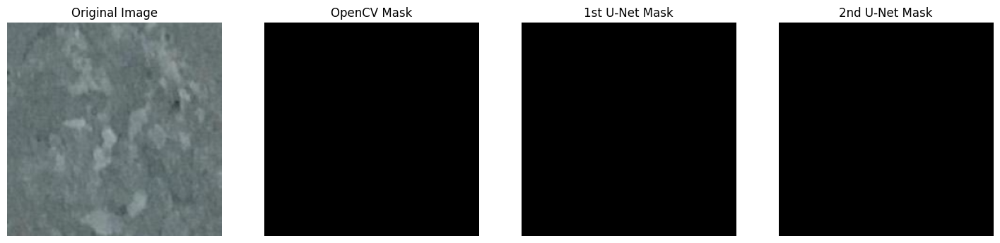

1/1 [==============================] - 0s 36ms/step


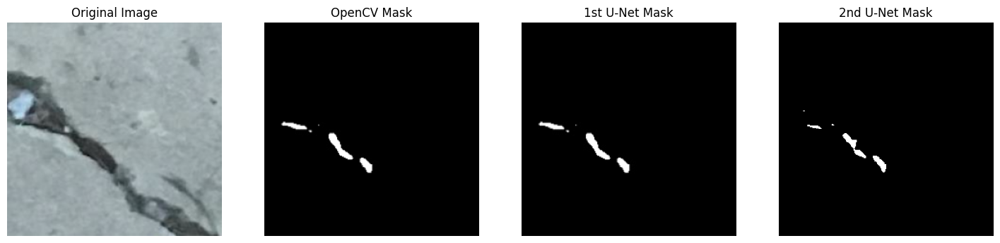

1/1 [==============================] - 0s 28ms/step


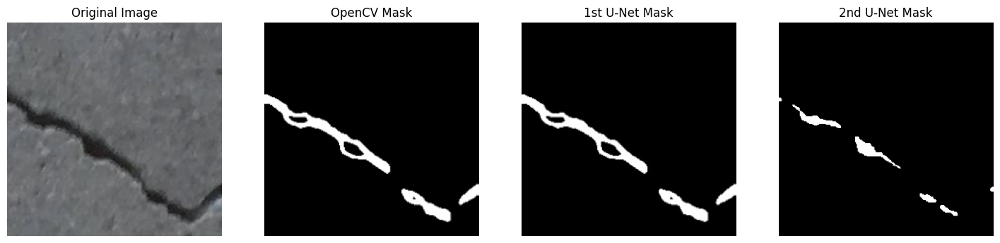

1/1 [==============================] - 0s 35ms/step


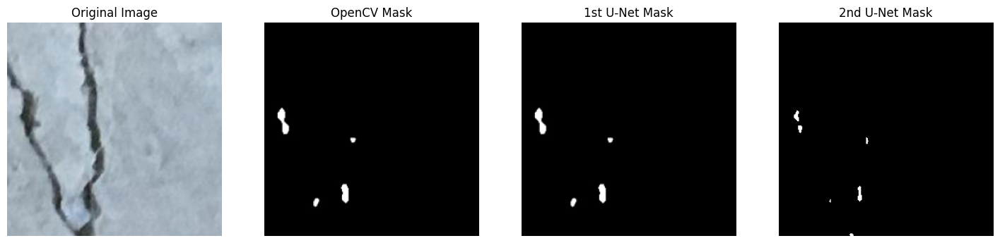

1/1 [==============================] - 0s 27ms/step


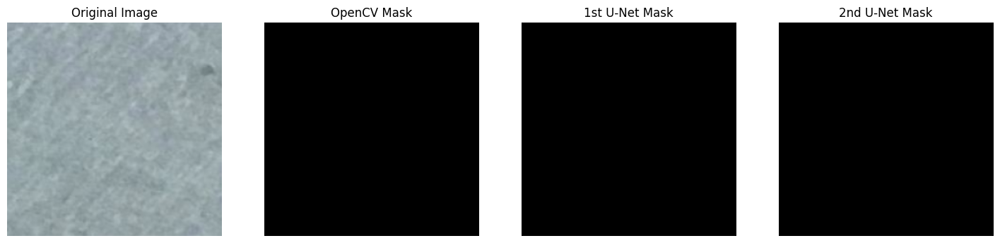

1/1 [==============================] - 0s 28ms/step


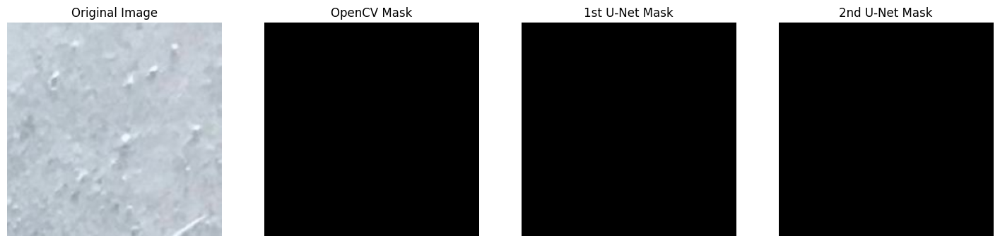

1/1 [==============================] - 0s 43ms/step


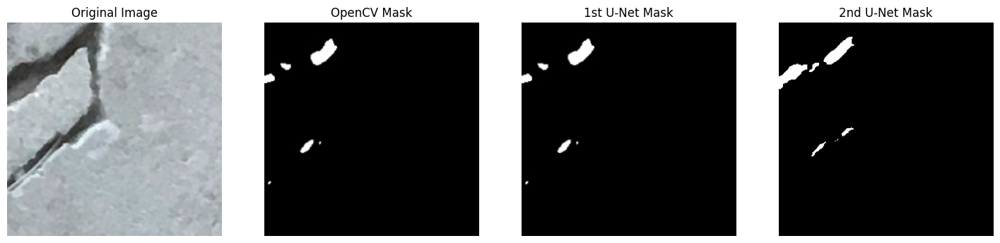

1/1 [==============================] - 0s 38ms/step


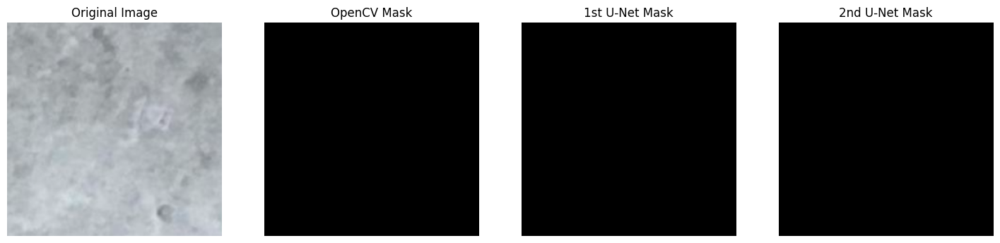

1/1 [==============================] - 0s 28ms/step


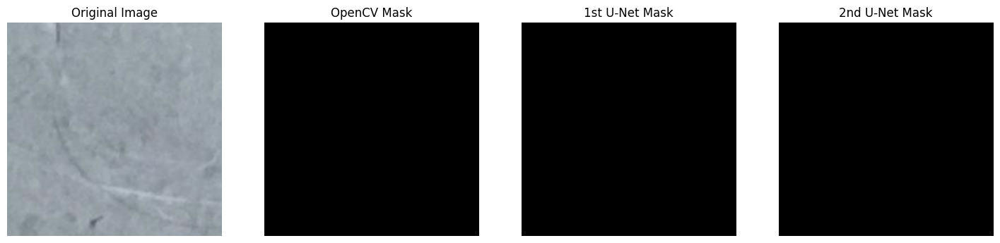

1/1 [==============================] - 0s 29ms/step


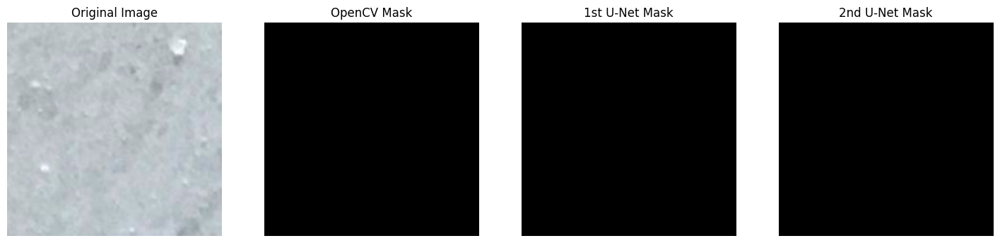

1/1 [==============================] - 0s 28ms/step


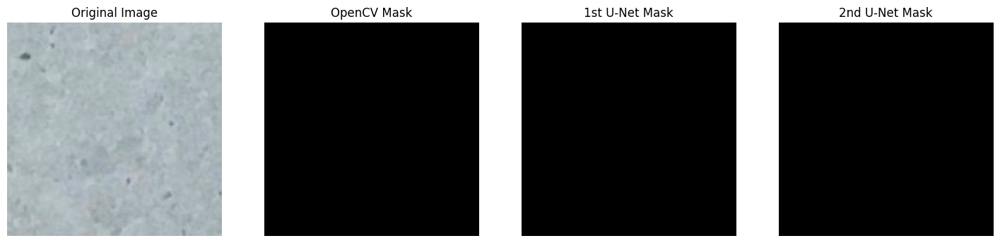

1/1 [==============================] - 0s 34ms/step


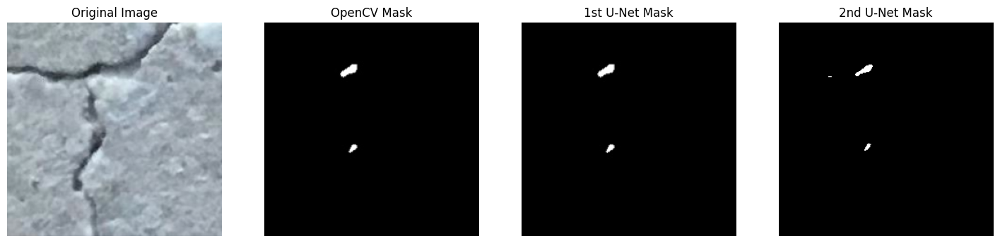

1/1 [==============================] - 0s 37ms/step


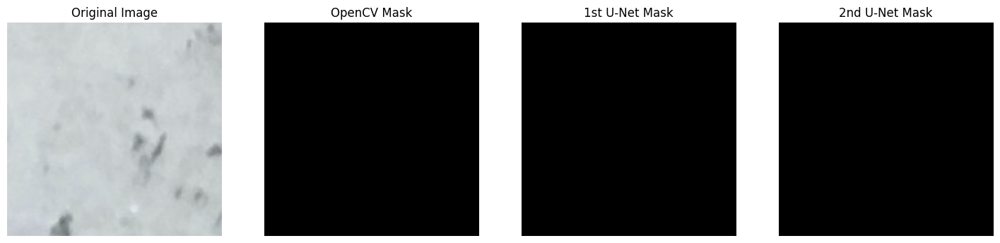

1/1 [==============================] - 0s 29ms/step


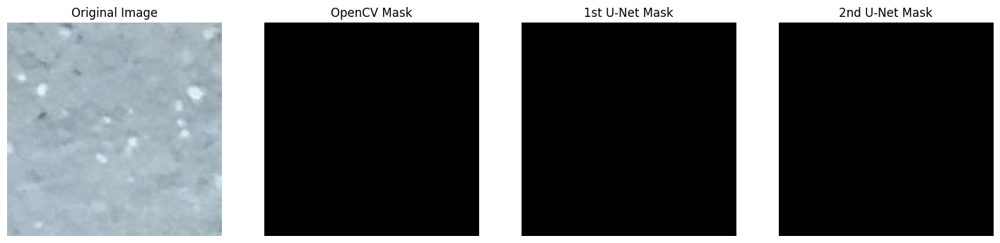

1/1 [==============================] - 0s 33ms/step


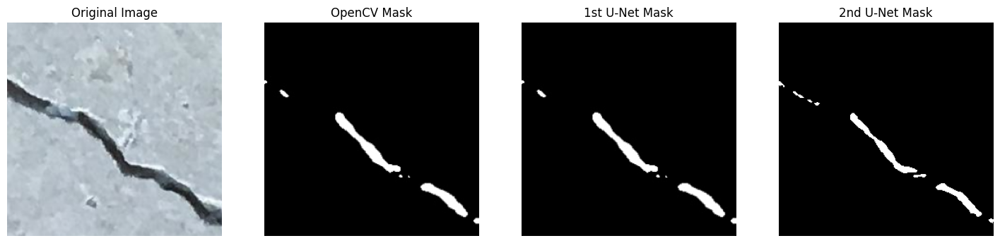

1/1 [==============================] - 0s 42ms/step


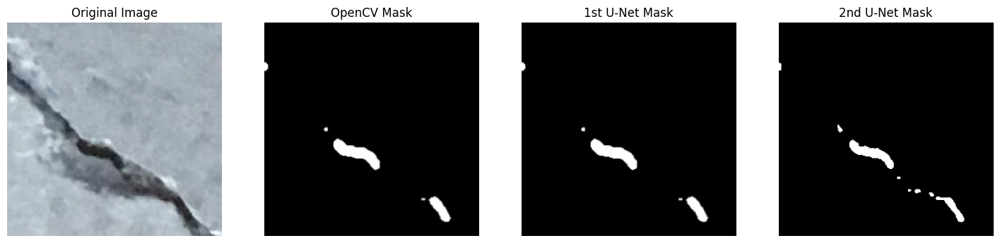

1/1 [==============================] - 0s 42ms/step


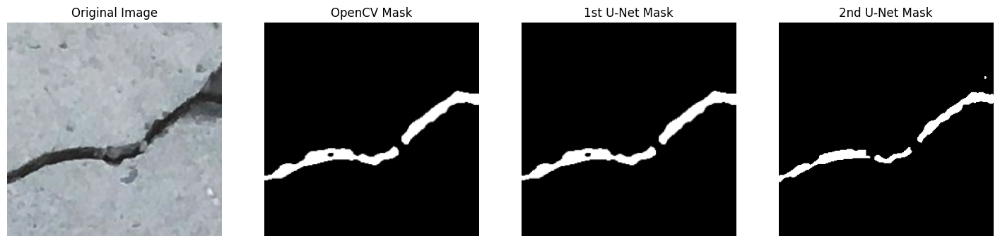

1/1 [==============================] - 0s 28ms/step


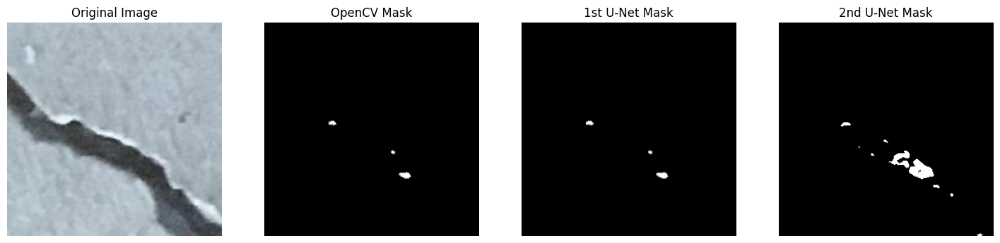

1/1 [==============================] - 0s 27ms/step


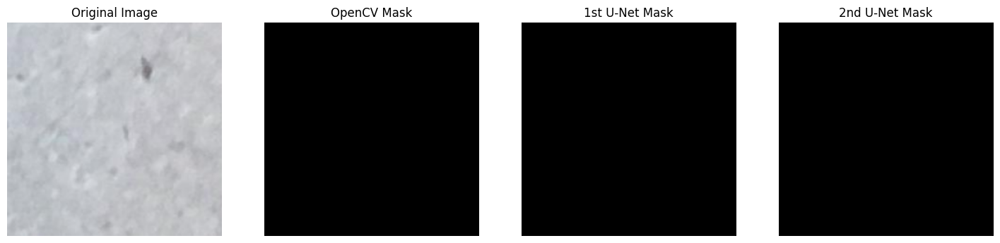

1/1 [==============================] - 0s 27ms/step


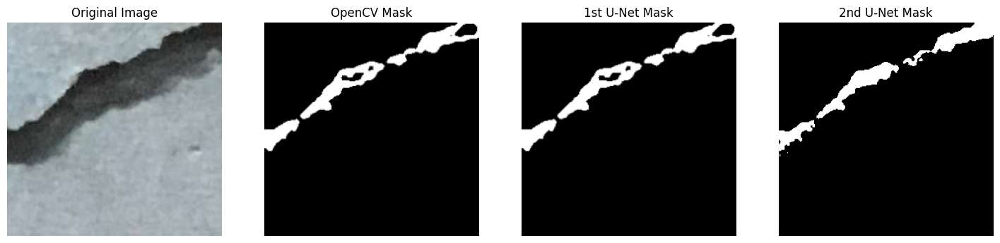

1/1 [==============================] - 0s 42ms/step


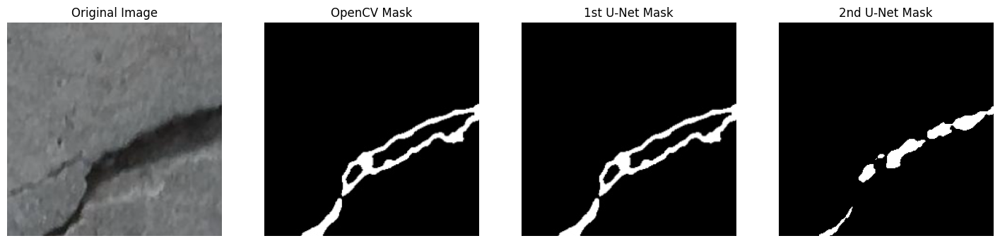

1/1 [==============================] - 0s 28ms/step


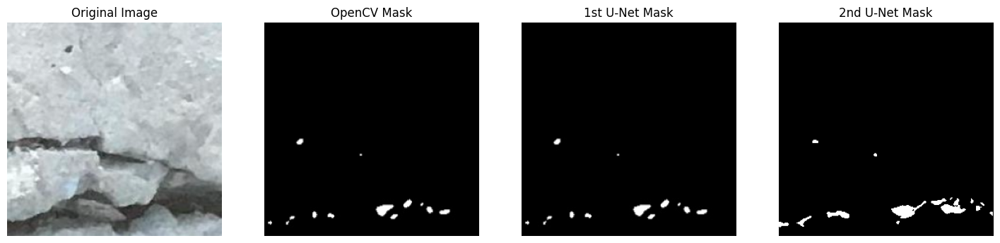

1/1 [==============================] - 0s 30ms/step


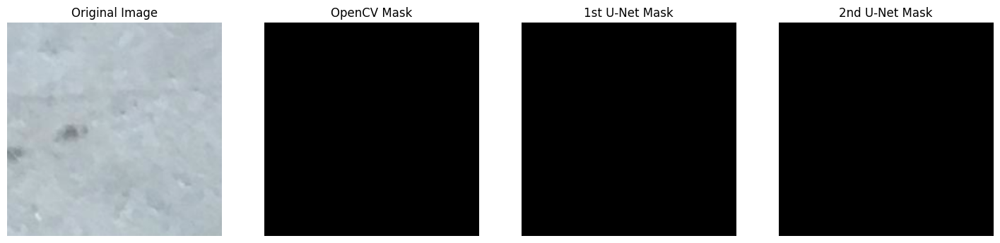

1/1 [==============================] - 0s 28ms/step


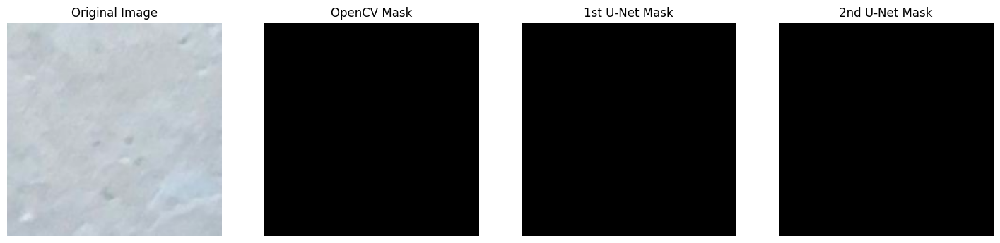

1/1 [==============================] - 0s 29ms/step


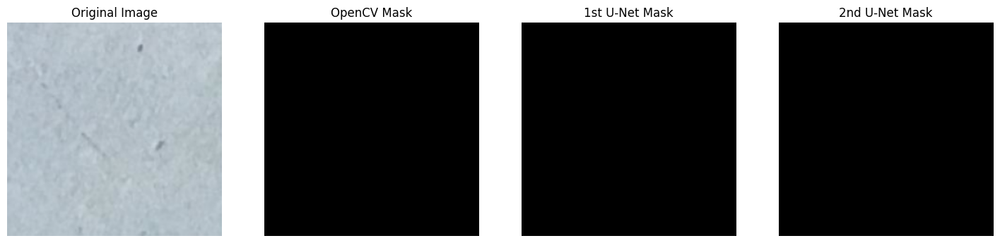

1/1 [==============================] - 0s 28ms/step


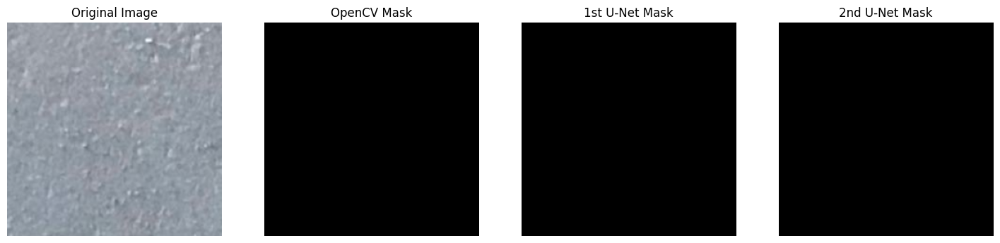

1/1 [==============================] - 0s 27ms/step


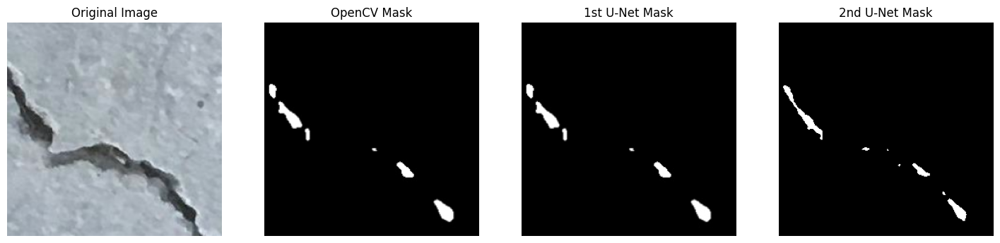

1/1 [==============================] - 0s 35ms/step


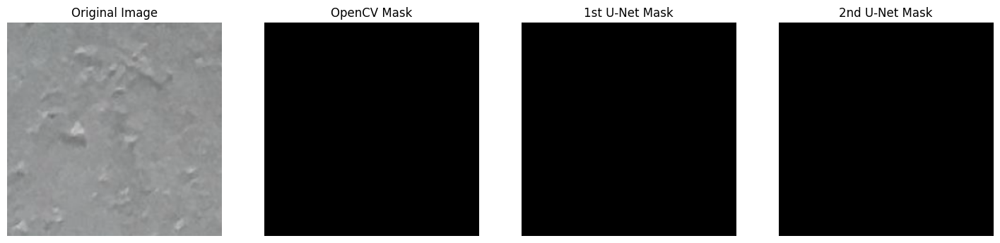

1/1 [==============================] - 0s 29ms/step


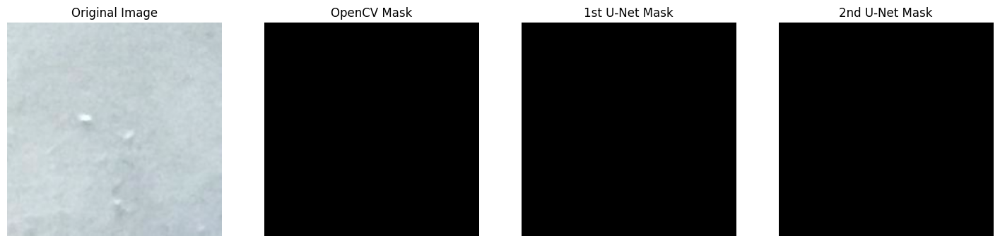

1/1 [==============================] - 0s 65ms/step


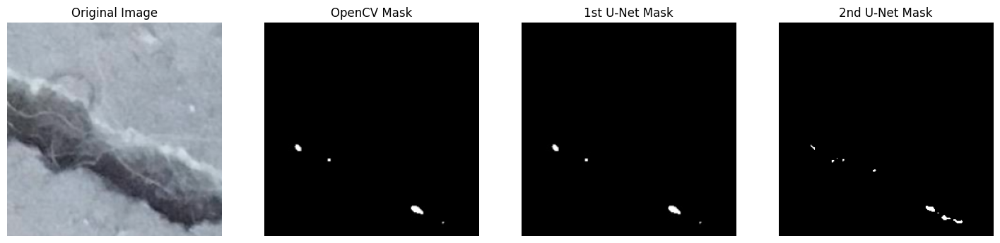

1/1 [==============================] - 0s 32ms/step


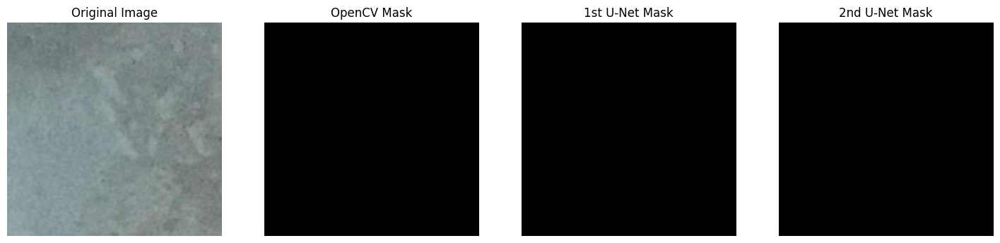

1/1 [==============================] - 0s 28ms/step


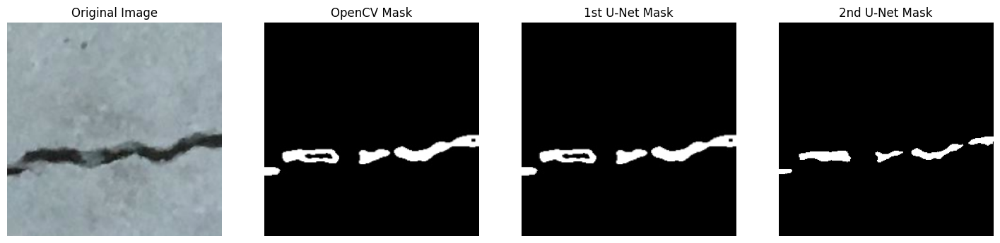

1/1 [==============================] - 0s 34ms/step


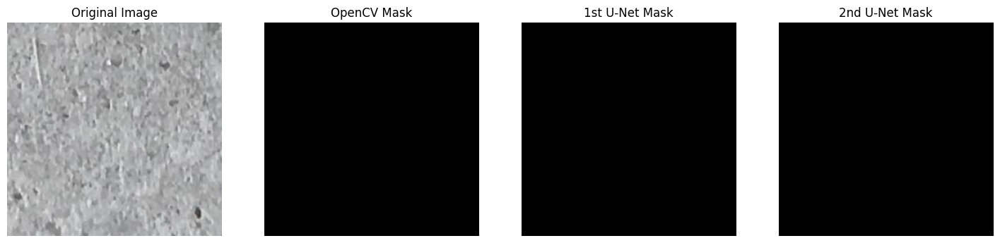

1/1 [==============================] - 0s 28ms/step


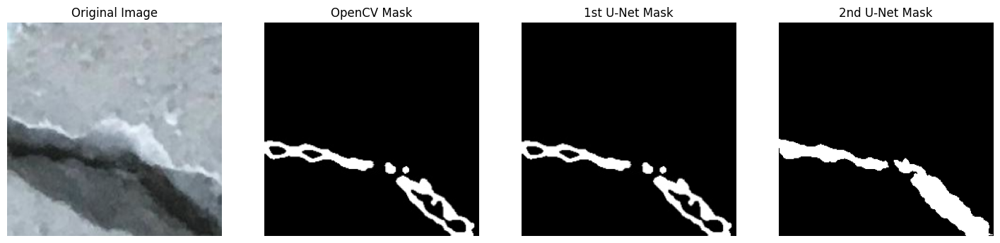

1/1 [==============================] - 0s 48ms/step


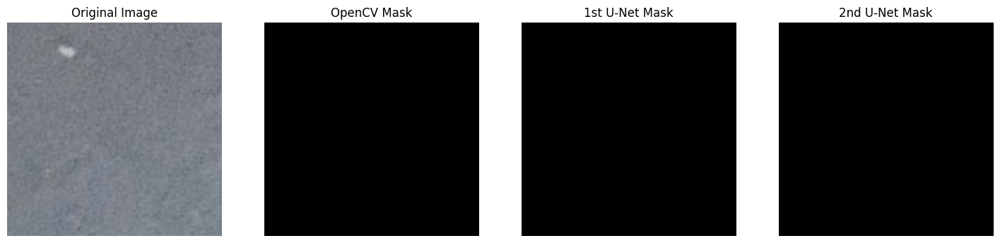

1/1 [==============================] - 0s 46ms/step


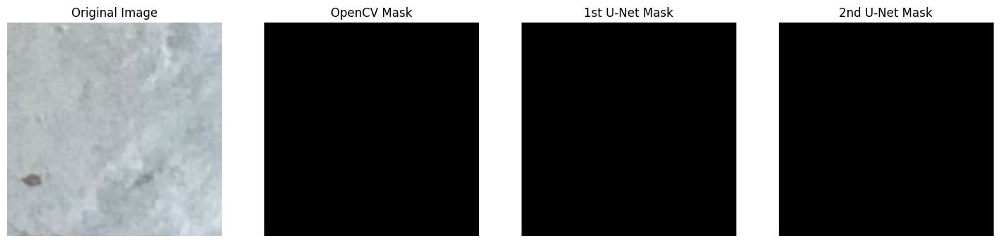

1/1 [==============================] - 0s 32ms/step


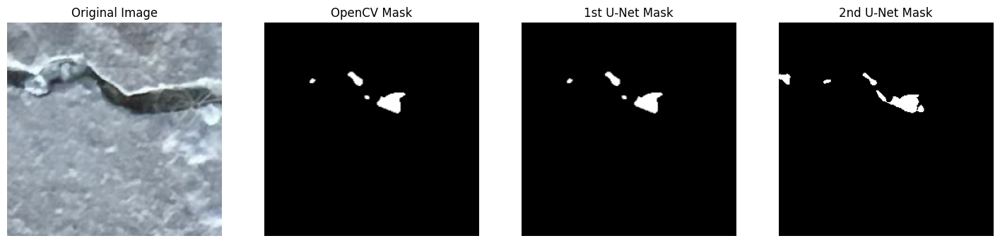

1/1 [==============================] - 0s 28ms/step


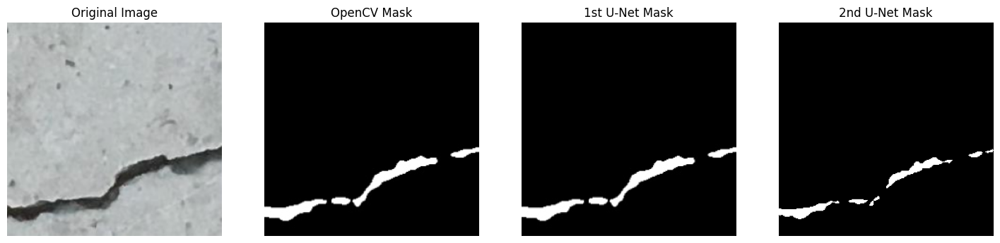

1/1 [==============================] - 0s 34ms/step


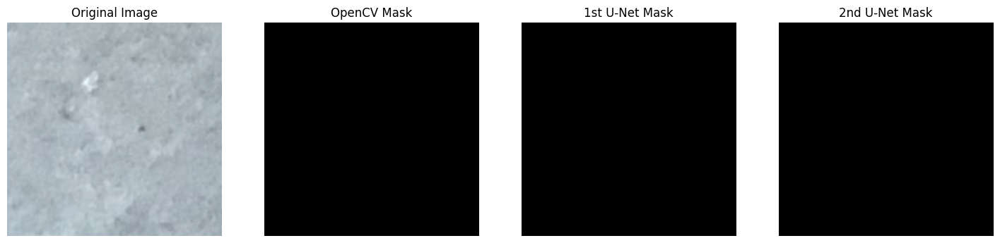

1/1 [==============================] - 0s 28ms/step


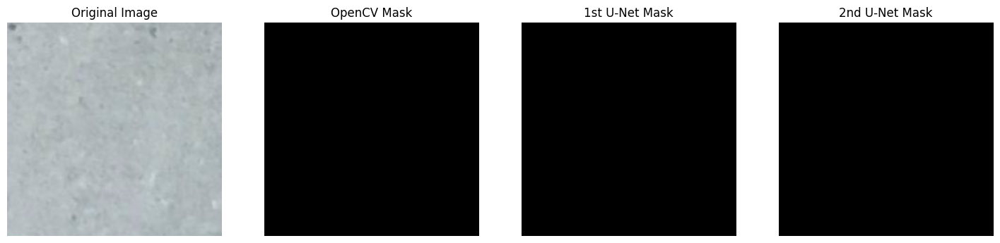

1/1 [==============================] - 0s 28ms/step


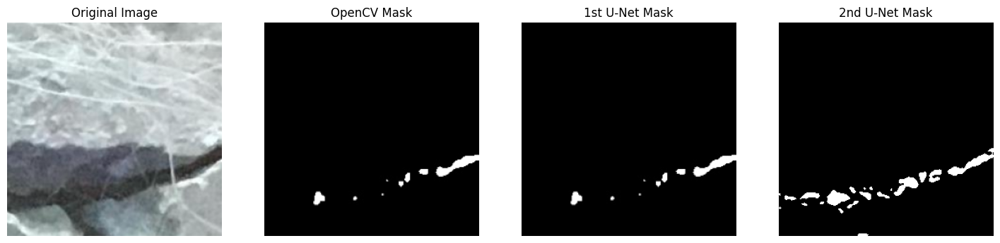

1/1 [==============================] - 0s 54ms/step


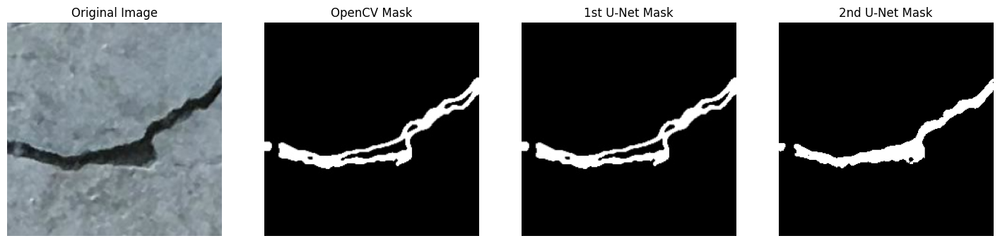

1/1 [==============================] - 0s 28ms/step


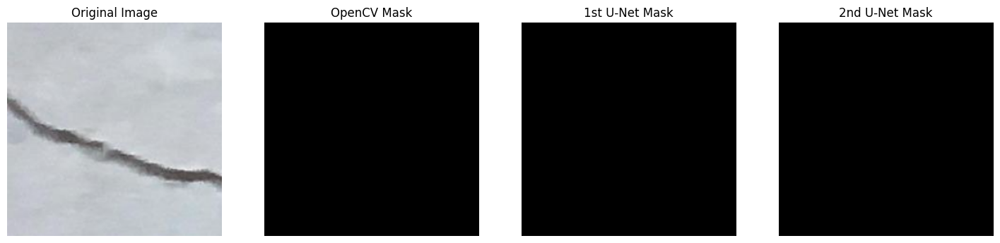

1/1 [==============================] - 0s 28ms/step


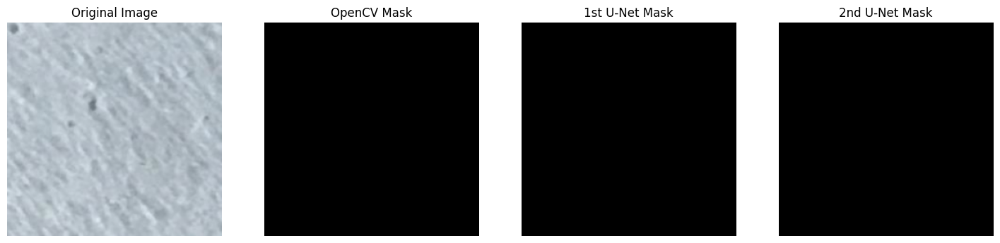

1/1 [==============================] - 0s 28ms/step


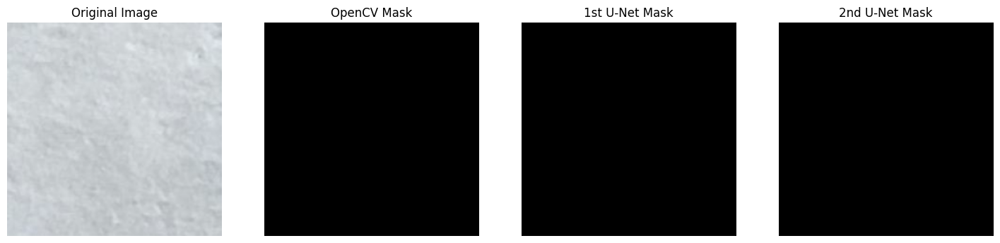

1/1 [==============================] - 0s 28ms/step


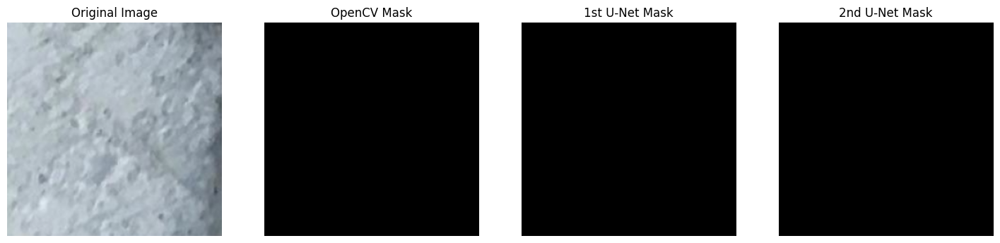

1/1 [==============================] - 0s 28ms/step


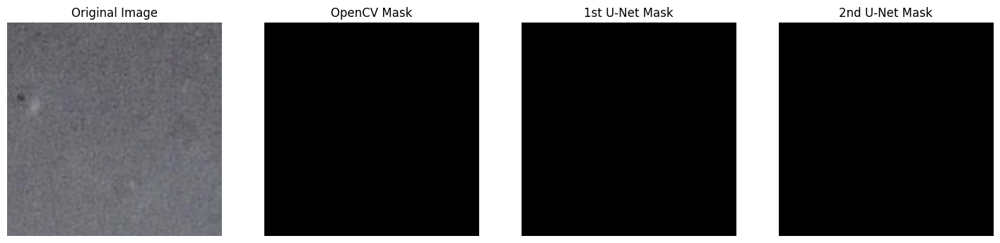

1/1 [==============================] - 0s 28ms/step


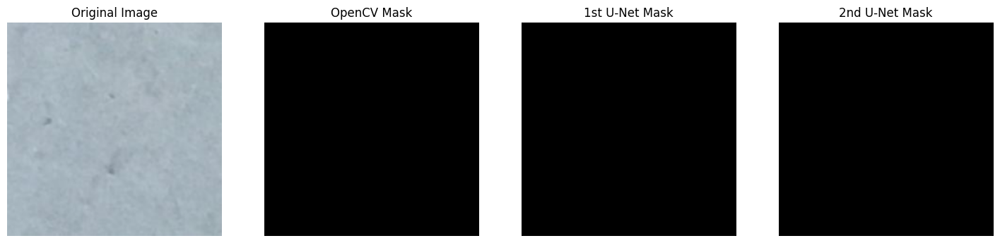

1/1 [==============================] - 0s 43ms/step


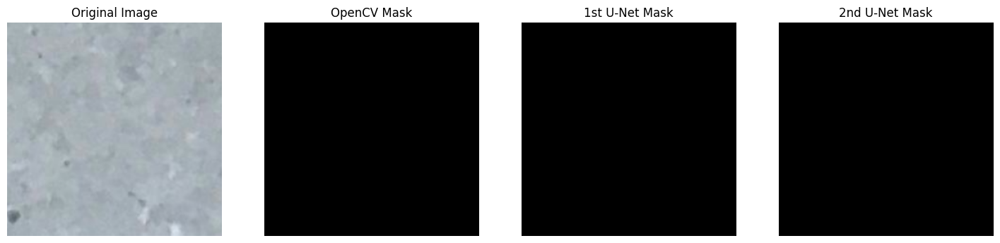

1/1 [==============================] - 0s 30ms/step


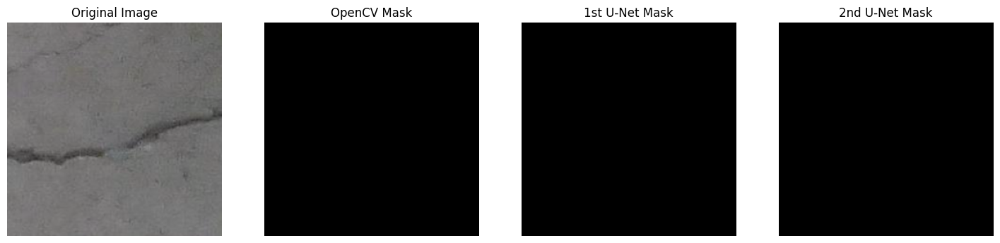

1/1 [==============================] - 0s 28ms/step


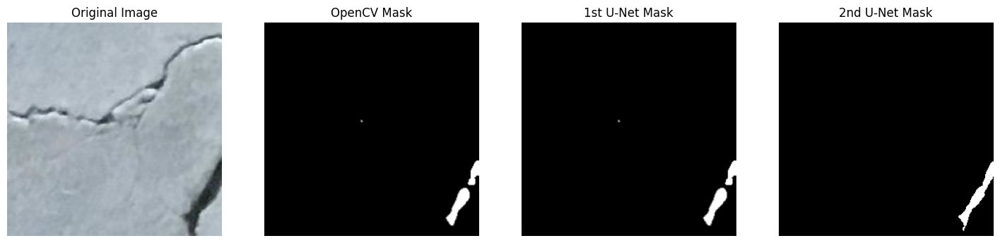

1/1 [==============================] - 0s 28ms/step


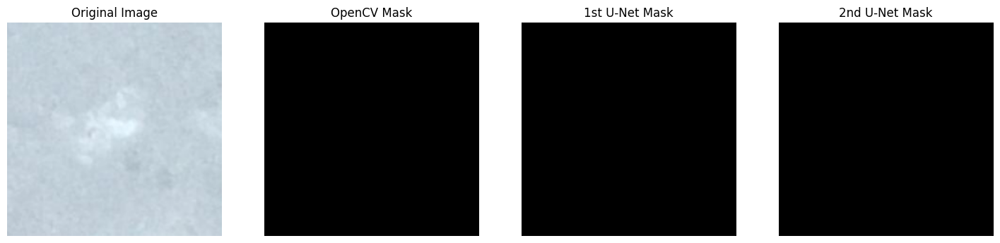

1/1 [==============================] - 0s 31ms/step


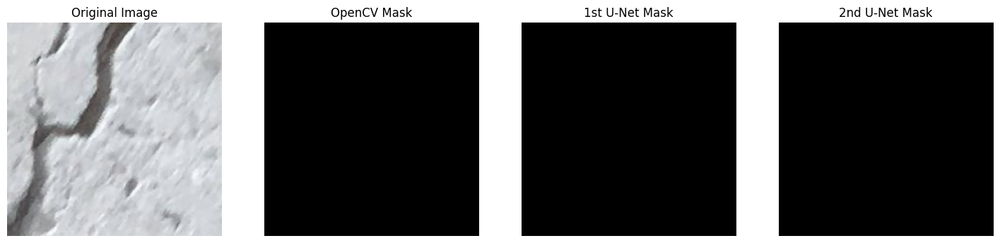

1/1 [==============================] - 0s 32ms/step


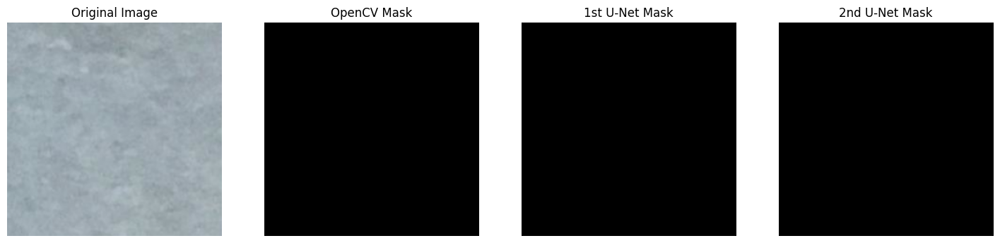

1/1 [==============================] - 0s 28ms/step


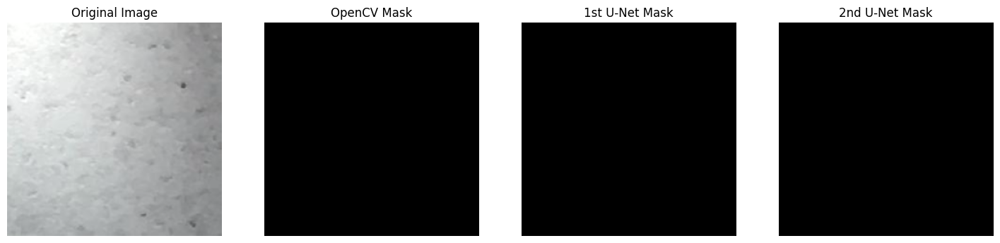

1/1 [==============================] - 0s 28ms/step


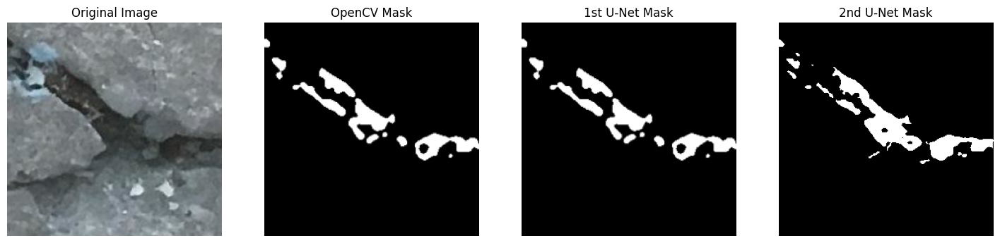

1/1 [==============================] - 0s 27ms/step


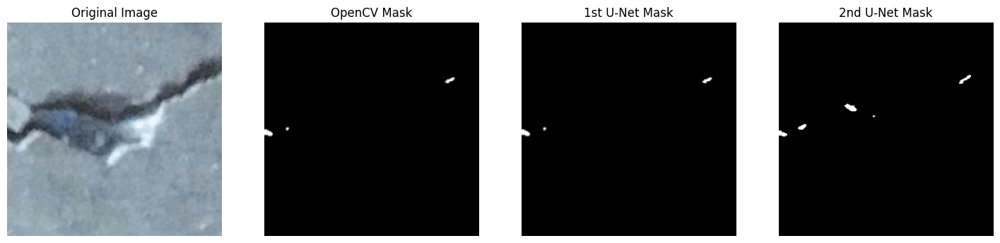

1/1 [==============================] - 0s 29ms/step


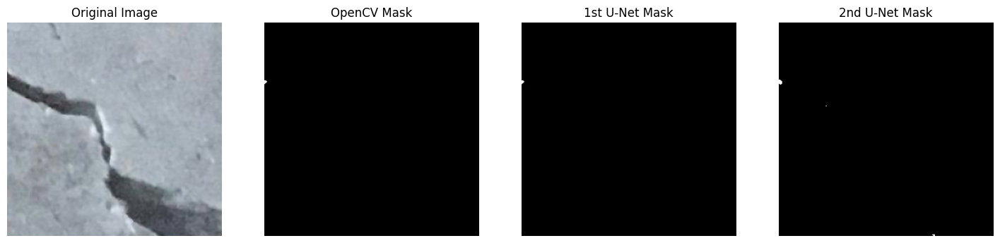

1/1 [==============================] - 0s 34ms/step


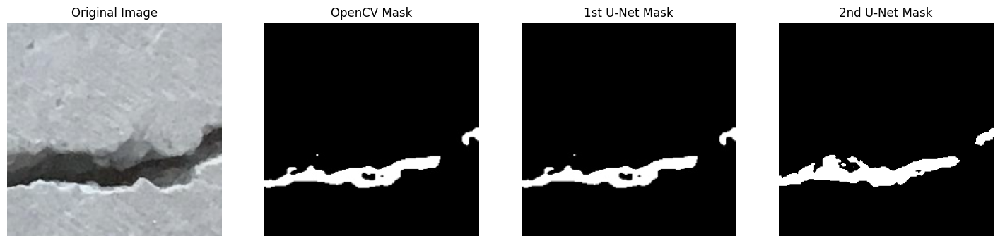

1/1 [==============================] - 0s 28ms/step


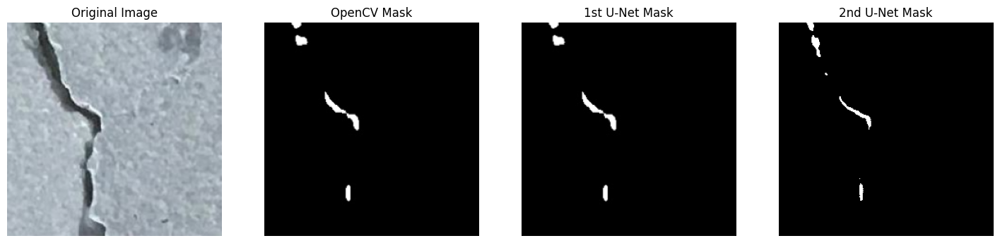

1/1 [==============================] - 0s 50ms/step


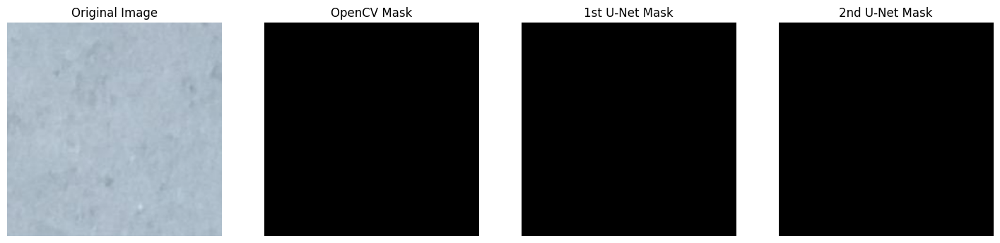

1/1 [==============================] - 0s 28ms/step


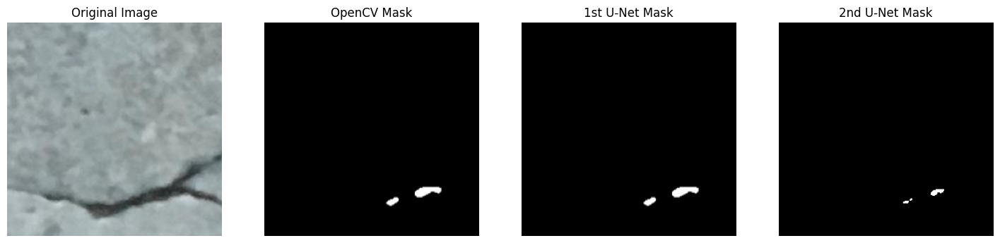

1/1 [==============================] - 0s 29ms/step


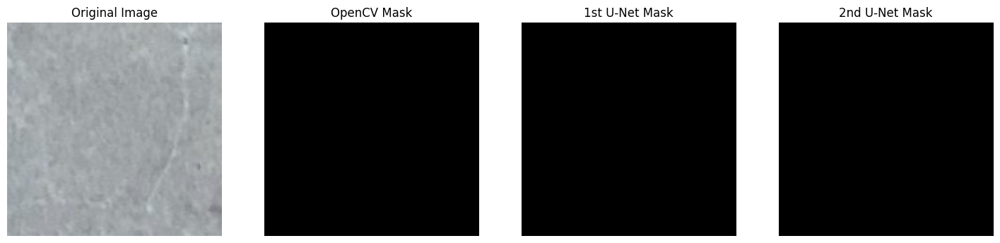

1/1 [==============================] - 0s 29ms/step


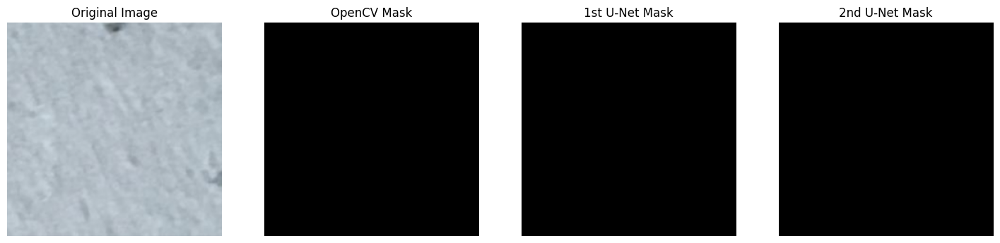

1/1 [==============================] - 0s 43ms/step


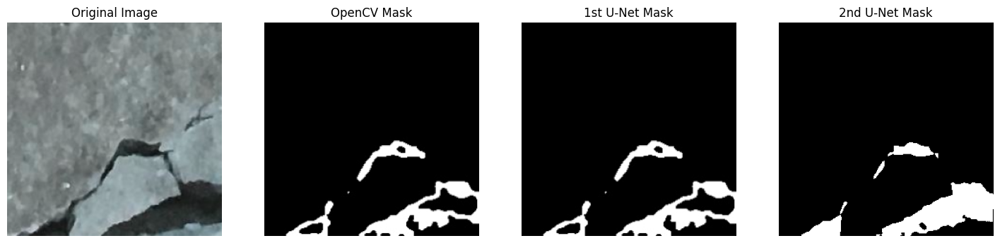

1/1 [==============================] - 0s 39ms/step


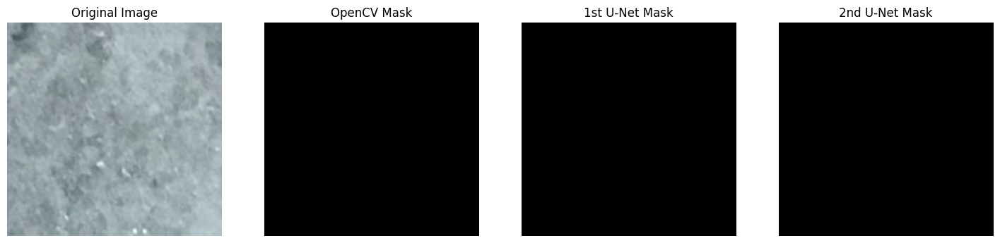

1/1 [==============================] - 0s 28ms/step


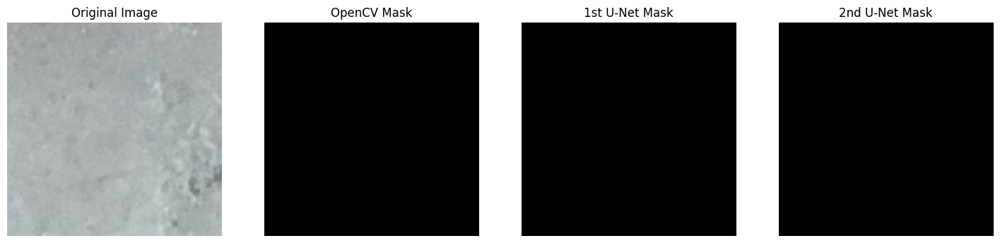

1/1 [==============================] - 0s 28ms/step


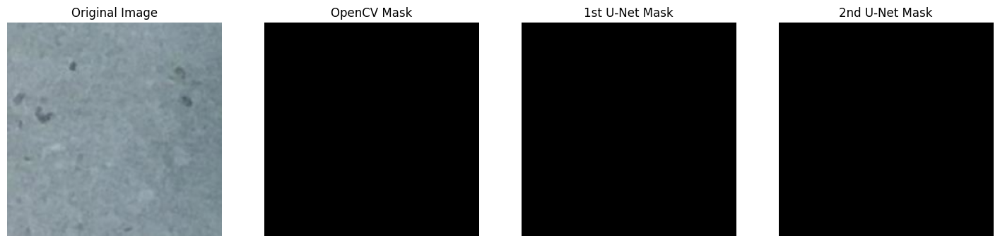

1/1 [==============================] - 0s 39ms/step


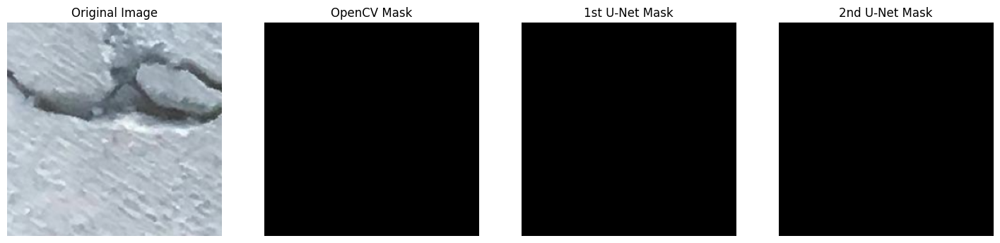

1/1 [==============================] - 0s 42ms/step


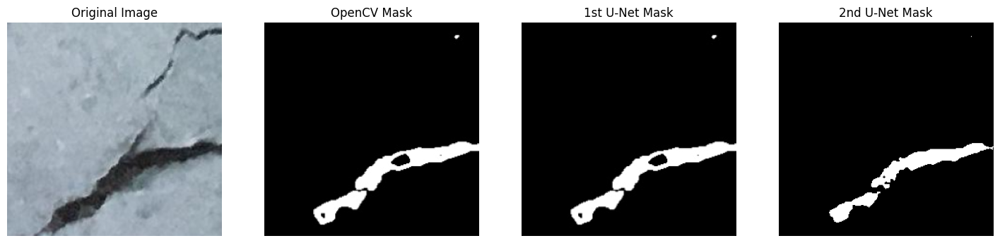

1/1 [==============================] - 0s 43ms/step


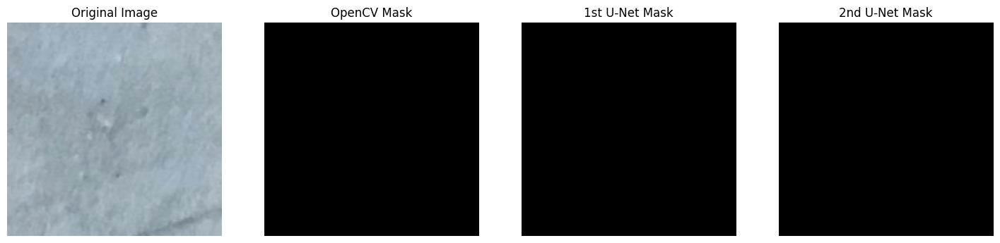

1/1 [==============================] - 0s 29ms/step


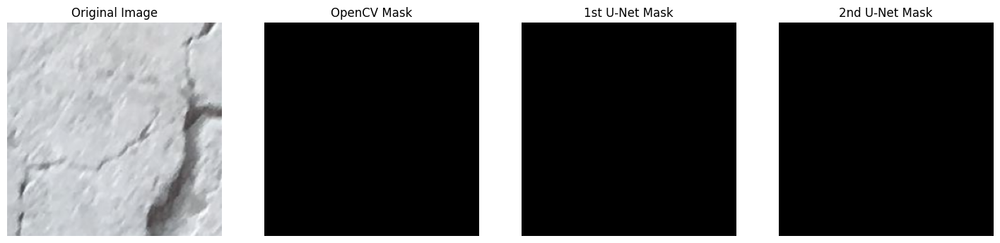

1/1 [==============================] - 0s 40ms/step


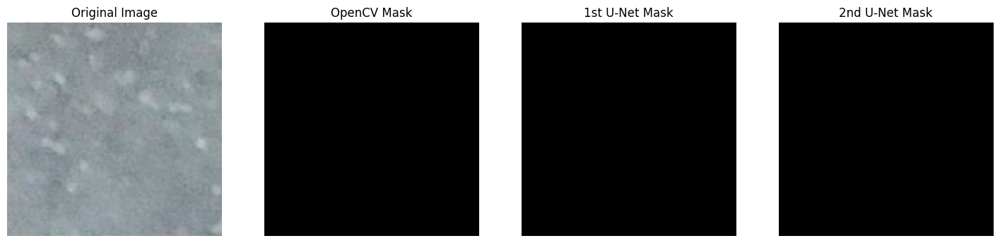

1/1 [==============================] - 0s 28ms/step


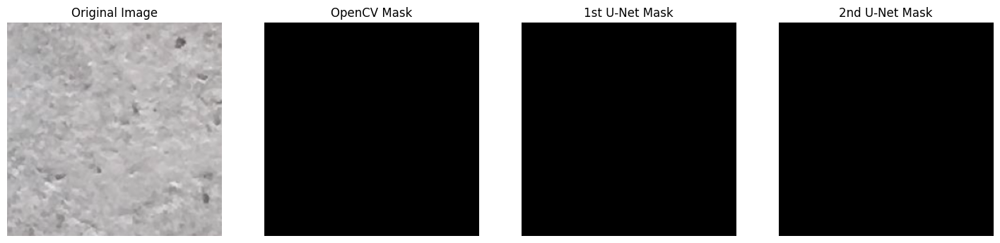

1/1 [==============================] - 0s 28ms/step


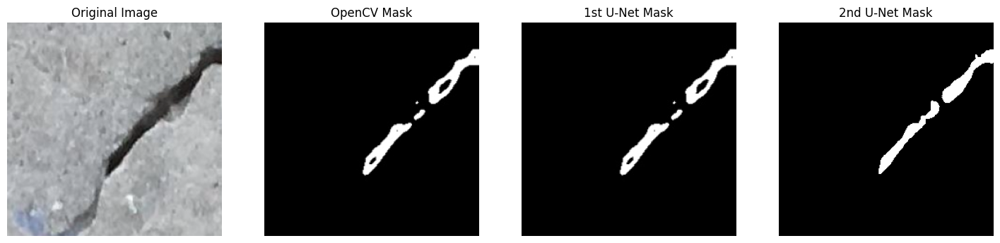

1/1 [==============================] - 0s 47ms/step


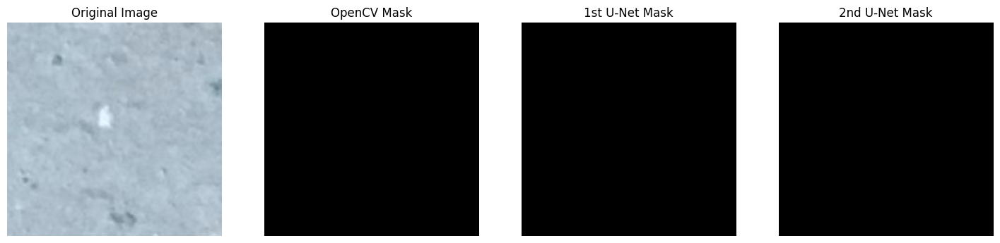

1/1 [==============================] - 0s 28ms/step


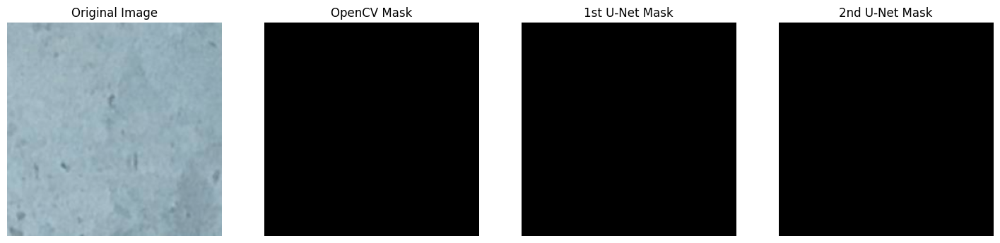

1/1 [==============================] - 0s 41ms/step


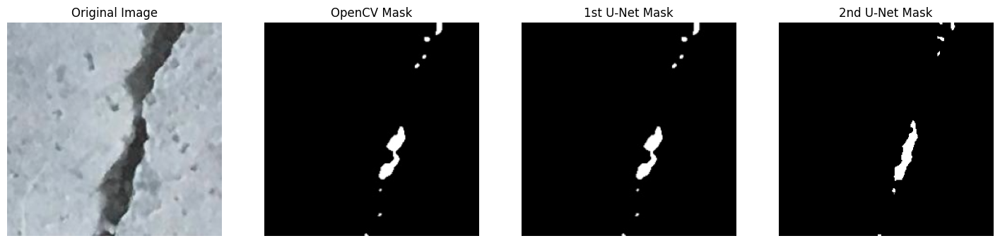

1/1 [==============================] - 0s 29ms/step


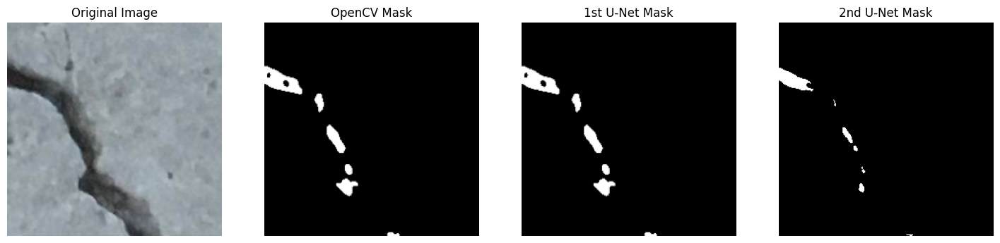

1/1 [==============================] - 0s 53ms/step


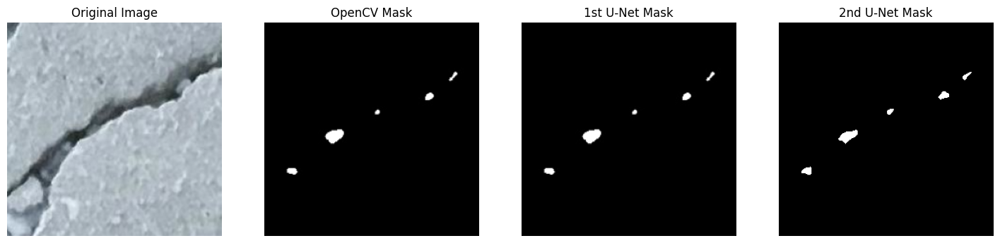

1/1 [==============================] - 0s 34ms/step


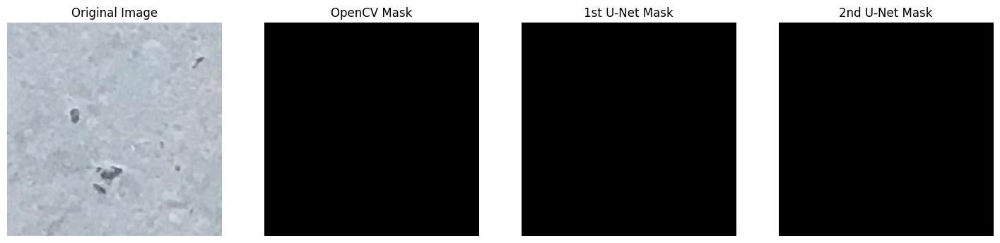

1/1 [==============================] - 0s 28ms/step


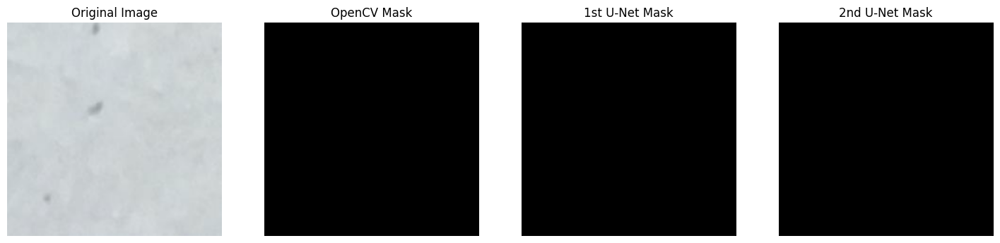

1/1 [==============================] - 0s 28ms/step


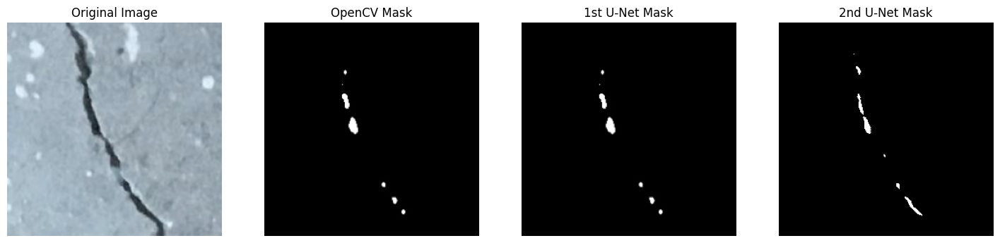

1/1 [==============================] - 0s 28ms/step


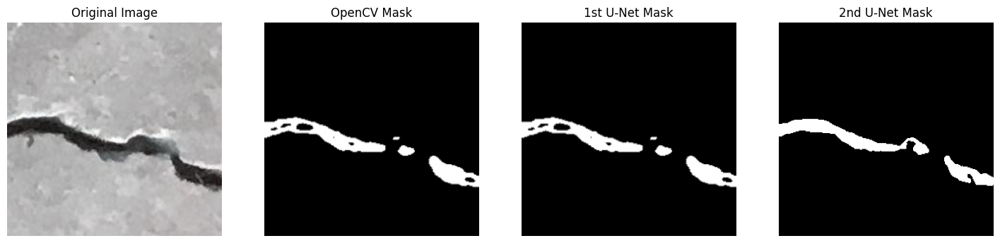

1/1 [==============================] - 0s 28ms/step


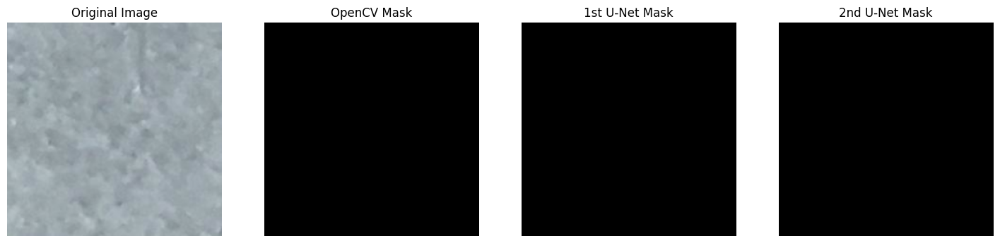

In [28]:
for _ in range(100):
    index = np.random.randint(1, len(crack_test_base_df.index))
    
    img = np.squeeze(cv2.imread(crack_test_base_df['image'].iloc[index]))

    plt.figure(figsize=(18, 18))
    
    plt.subplot(1, 4, 1)
    img = cv2.resize(img, (256, 256))
    plt.imshow(np.squeeze(img)) #, cmap='gray', vmin=0, vmax=1)
    plt.axis('off')
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    img_mask = np.squeeze(cv2.imread(crack_test_base_df['mask'].iloc[index],  cv2.IMREAD_GRAYSCALE))
    plt.imshow(img_mask , cmap='gray') #, vmin=0, vmax=255)
    plt.axis('off')
    plt.title('OpenCV Mask')

    plt.subplot(1, 4, 3)
    img_mask_2 = np.squeeze(cv2.imread(crack_test_base_df['mask_2'].iloc[index],  cv2.IMREAD_GRAYSCALE))
    plt.imshow(img_mask , cmap='gray') #, vmin=0, vmax=255)
    plt.axis('off')
    plt.title('1st U-Net Mask')

    plt.subplot(1, 4, 4)
    img = img / np.max(img)
    img = img[np.newaxis, :, :]
    img_mask_2 = unet_model_2.predict(img)
    img_mask_2 = np.squeeze(img_mask_2)
    img_threshold = 0.5
    img_mask_2[img_mask_2 > img_threshold] = 1
    img_mask_2[img_mask_2 <= img_threshold] = 0
    plt.imshow(img_mask_2 , cmap='gray') #, vmin=0, vmax=255)
    plt.axis('off')
    plt.title('2nd U-Net Mask')

    plt.show()